In [1]:
%matplotlib widget

In [2]:
# Import libraries

import numpy as np
import matplotlib.pyplot as plt
import empymod 
from scipy.constants import mu_0
import pygimli as pg
from pygimli.viewer.mpl import drawModel1D
from sklearn.metrics import root_mean_squared_error
from numpy import linalg as LA
from itertools import product
import plotly.express as px
import pandas as pd
from mpl_toolkits.mplot3d import axes3d
import matplotlib.colors as colors
import random

import sys

sys.path.insert(1, '../src')

from FDEM import FDEM, FDEM_1D

# Find Ill-posedness of an inversion problem

In [3]:
# Define a true model
models = list(np.load('Models/Equi_models_UC_1.npy'))

random.seed(5000)
model_true_1 = (random.sample(models, k = 1))[0]

start_models = list(product(np.linspace(0.1,5), np.logspace(0,3.2)/1000, np.logspace(0,3.3)/1000 ))  #list(np.array([np.ones_like(sigma_sm), sigma_sm/1000, sigma_sm/1000]).T)


# Define random starting models

In [4]:
random.seed(10)
model_start_1 = random.sample(start_models, k=1)[0]
model_start_1

(3.0000000000000004, 1.1732424147777691, 0.9188937680019572)

In [5]:
model_true_1

array([2.88889506, 0.17307655, 0.01730766])

# Run Inversion

In [6]:
# Inversion for 2 Layers

FOP = FDEM_1D(nlay = 2)

data = FOP.response(model_true_1)

transThk = pg.trans.TransLogLU(0.1,5.1)
transSig = pg.trans.TransLogLU(1/1000,2000/1000)

FOP.region(0).setTransModel(transThk)
FOP.region(1).setTransModel(transSig)

inv = pg.Inversion()
inv.setForwardOperator(FOP)
J = inv.fop.jacobian()

rel_err = np.ones_like(data)*1e-1
model_inv = inv.run(data, rel_err, verbose=True, startModel=model_start_1, lam=0, )

model_inv

25/03/25 - 10:55:52 - pyGIMLi - INFO - Starting inversion.


min/max(dweight) = 0.0742874/50.6465
fop: <FDEM.FDEM_1D object at 0x7f94fbfde890>
Data transformation: <pgcore._pygimli_.RTrans object at 0x7f94faee46d0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x7f94faf12020>
	 1 <pgcore._pygimli_.RTransLogLU object at 0x7f94faf12070>
min/max (data): -135/110
min/max (error): 10%/10%
min/max (start model): 0.92/3
--------------------------------------------------------------------------------
use model trans from RegionManager
min/max(dweight) = 0.0742874/50.6465
Building constraints matrix
constraint matrix of size(nBounds x nModel) 1 x 3
check Jacobian: wrong dimensions: (0x0) should be (18x3)  force: 1
jacobian size invalid, forced recalc: 1
inv.iter 0 ... chi² = 42714.23
--------------------------------------------------------------------------------
inv.iter 1 ... Calculating Jacobian matrix (forced=1)...Create Jacobian matrix (brute force) ... ... 0.00864018 s.
... 0.0115924 s
min data = -134.612 max data =

3 [0.1, 0.14845300327276484, 0.0010000000099994267]

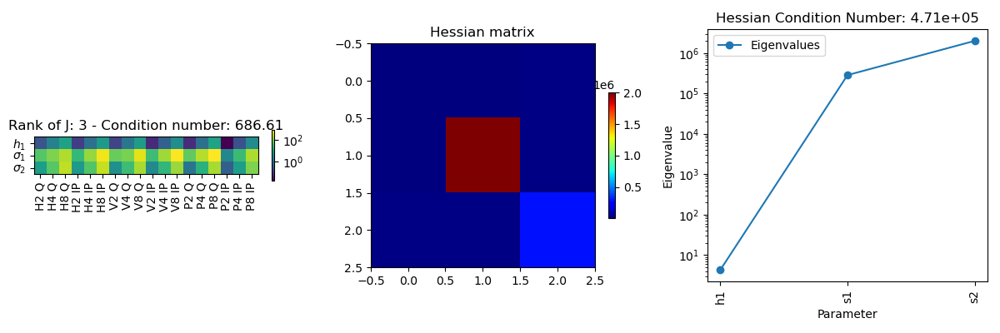

In [7]:
fig, ax = plt.subplots(1,3, figsize=(12,4))

# Plot Jacobian
c = ax[0].imshow(np.abs(np.array(J)).T, norm='log')
fig.colorbar(c, shrink=0.2, ax=ax[0])
xticks = ['H2 Q', 'H4 Q', 'H8 Q', 'H2 IP', 'H4 IP', 'H8 IP', 'V2 Q', 'V4 Q', 'V8 Q',
          'V2 IP', 'V4 IP', 'V8 IP', 'P2 Q', 'P4 Q', 'P8 Q', 'P2 IP', 'P4 IP', 'P8 IP' ]
yticks = ['$h_1$', '$\sigma_1$', '$\sigma_2$' ]
ax[0].set_xticks(range(len(data)), labels=xticks, rotation = 90)
ax[0].set_yticks(range(len(model_true_1)), labels=yticks)
ax[0].set_title('Rank of J: ' + str( np.linalg.matrix_rank(J)) +' - Condition number: %.2f' %np.linalg.cond(J) )

# Calculate Hessian
J = np.array(J)
JTJ = np.matmul(J.T,J)
# Plot Hessian
c = ax[1].imshow(JTJ, cmap='jet') 
fig.colorbar(c, ax=ax[1], shrink=0.5)
ax[1].set_title('Hessian matrix')

# Compute eigenvalues
eigenvalues, eigenvectors = LA.eigh(JTJ)  # More stable for symmetric matrices

# Plot eigenvalues

xticks = ['h1', 's1', 's2']

ax[2].set_xticks(range(3), labels=xticks, rotation = 90)
ax[2].semilogy(eigenvalues, 'o-', label="Eigenvalues")
#ax[2].axhline(y=0, color='r', linestyle='--', label="Zero Line")
ax[2].set_xlabel("Parameter")
ax[2].set_ylabel("Eigenvalue")
ax[2].legend()

# Print condition number
condition_number = np.max(eigenvalues) / np.min(eigenvalues)
ax[2].set_title(f"Hessian Condition Number: {condition_number:.2e}")

plt.tight_layout()

# Check with 10 different starting models

In [8]:

random.seed(10)
model_start_10 = random.sample(start_models, k=10)
model_start_10

[(3.0000000000000004, 1.1732424147777691, 0.9188937680019572),
 (0.2, 0.19306977288832516, 0.022229964825261954),
 (2.3000000000000003, 0.036927247632482604, 0.010237739663395853),
 (2.6, 0.009540954763499941, 0.001),
 (3.1, 0.009540954763499941, 0.02595886586126395),
 (0.1, 0.30313260596675495, 0.9188937680019572),
 (1.1, 0.40949150623804276, 0.0075077569396292095),
 (2.5000000000000004, 0.006076779379941533, 0.12239258348277579),
 (4.3, 0.12296907844759389, 0.0015923583747395544),
 (2.6, 0.2608113761201518, 1.0730309405261564)]

In [9]:
# Run inversions

J_s = []
model_test = []

for sm in model_start_10:
    # Inversion for 2 Layers
    if (sm == model_true_1).any():
        pass
    else:
        model_test.append(sm)

        FOP = FDEM_1D(nlay = 2)
        
        data = FOP.response(model_true_1)
        
        transThk = pg.trans.TransLogLU(0.01,5.1)
        transSig = pg.trans.TransLogLU(1/1000,2000/1000)
        
        FOP.region(0).setTransModel(transThk)
        FOP.region(1).setTransModel(transSig)
        
        inv = pg.Inversion()
        inv.setForwardOperator(FOP)
        J = inv.fop.jacobian()
        
        rel_err = np.ones_like(data)*1e-1
        model_inv = inv.run(data, rel_err, verbose=False, startModel=sm, lam=0, )
        J_s.append(np.array(J))

In [10]:
# Calculate rank, Condition number, hessians and eigenvalues

rank_J = []
CN_J = []
CN_H = []
eigenvalues_H = []
#ev_h1 = []
#ev_s1 = []
#ev_s2 = []
condition = []

for j in J_s:
    rank_J.append(np.linalg.matrix_rank(j))
    CN_J.append(np.linalg.cond(j))
    H = np.matmul(j.T, j)
    eigenvalues, eigenvectors = LA.eigh(H)
    eigenvalues_H.append(eigenvalues)
    CN_H.append( np.max(eigenvalues) / np.min(eigenvalues))
    
    if np.all(np.array(eigenvalues) > 0):
        condition.append(1)
        print("The Hessian is positive definite → Likely a global minimum.")
    elif np.any(np.array(eigenvalues) < 0):
        condition.append(-1)
        print("The Hessian has negative eigenvalues → Could be a saddle point or local maximum.")
    else:
        condition.append(0)
        print("The Hessian has near-zero eigenvalues → Possible flat directions (ill-conditioning).")


The Hessian is positive definite → Likely a global minimum.
The Hessian is positive definite → Likely a global minimum.
The Hessian is positive definite → Likely a global minimum.
The Hessian is positive definite → Likely a global minimum.
The Hessian is positive definite → Likely a global minimum.
The Hessian is positive definite → Likely a global minimum.
The Hessian is positive definite → Likely a global minimum.
The Hessian is positive definite → Likely a global minimum.
The Hessian is positive definite → Likely a global minimum.
The Hessian is positive definite → Likely a global minimum.


In [11]:
df_10 = pd.DataFrame(data= np.array([np.array(model_test)[:,0], np.array(model_test)[:,1], np.array(model_test)[:,2], rank_J,
                                 CN_J, CN_H, condition]).T, columns = ['h_1', 'sig_1', 'sig_2', 'rank_J', 'CN_J', 'CN_H', 'cond'])


In [12]:
df_10.style.highlight_max(subset=pd.IndexSlice[:, ['cond']], color='green')

,h_1,sig_1,sig_2,rank_J,CN_J,CN_H,cond
0,3.000000,1.173242,0.918894,3.000000,686.576357,471387.094576,1.000000
1,0.200000,0.193070,0.022230,3.000000,119.791723,14350.056818,1.000000
2,2.300000,0.036927,0.010238,3.000000,687.731355,472974.416963,1.000000
3,2.600000,0.009541,0.001000,3.000000,686.545713,471345.016060,1.000000
4,3.100000,0.009541,0.025959,3.000000,183964.372908,33842795800.522137,1.000000
5,0.100000,0.303133,0.918894,3.000000,109501.409984,11990581240.420528,1.000000
6,1.100000,0.409492,0.007508,3.000000,202.210674,40889.156542,1.000000
7,2.500000,0.006077,0.122393,3.000000,183650.362677,33727468757.040588,1.000000
8,4.300000,0.122969,0.001592,3.000000,173.043294,29943.981703,1.000000
9,2.600000,0.260811,1.073031,3.000000,629.208116,395902.853385,1.000000


# Check with 100 different starting models

In [13]:
random.seed(10)
model_start_100 = random.sample(start_models, k=100)

# Run inversions

J_s = []
model_test = []

for sm in model_start_100:
    # Inversion for 2 Layers
    if (sm == model_true_1).any():
        pass
    else:
        model_test.append(sm)
        FOP = FDEM_1D(nlay = 2)
        
        data = FOP.response(model_true_1)
        
        transThk = pg.trans.TransLogLU(0.01,5.1)
        transSig = pg.trans.TransLogLU(1/1000,2000/1000)
        
        FOP.region(0).setTransModel(transThk)
        FOP.region(1).setTransModel(transSig)
        
        inv = pg.Inversion()
        inv.setForwardOperator(FOP)
        J = inv.fop.jacobian()
        
        rel_err = np.ones_like(data)*1e-1
        model_inv = inv.run(data, rel_err, verbose=False, startModel=sm, lam=0, )
        J_s.append(np.array(J))

# Calculate rank, Condition number, hessians and eigenvalues

rank_J = []
CN_J = []
CN_H = []
eigenvalues_H = []
#ev_h1 = []
#ev_s1 = []
#ev_s2 = []
condition = []

for j in J_s:
    rank_J.append(np.linalg.matrix_rank(j))
    CN_J.append(np.linalg.cond(j))
    H = np.matmul(j.T, j)
    eigenvalues, eigenvectors = LA.eigh(H)
    eigenvalues_H.append(eigenvalues)
    CN_H.append( np.max(eigenvalues) / np.min(eigenvalues))
    
    if np.all(np.array(eigenvalues) > 0):
        condition.append(1)
       # print("The Hessian is positive definite → Likely a global minimum.")
    elif np.any(np.array(eigenvalues) < 0):
        condition.append(-1)
       # print("The Hessian has negative eigenvalues → Could be a saddle point or local maximum.")
    else:
        condition.append(0)
       # print("The Hessian has near-zero eigenvalues → Possible flat directions (ill-conditioning).")


/tmp/ipykernel_271463/510441030.py:50: RuntimeWarning: divide by zero encountered in scalar divide
  CN_H.append( np.max(eigenvalues) / np.min(eigenvalues))


In [14]:
df_100 = pd.DataFrame(data= np.array([np.array(model_test)[:,0], np.array(model_test)[:,1], np.array(model_test)[:,2], rank_J,
                                 CN_J, CN_H, condition]).T, columns = ['h_1', 'sig_1', 'sig_2', 'rank_J', 'CN_J', 'CN_H', 'cond'])

df_100.style.background_gradient(subset=pd.IndexSlice[:, ['rank_J', 'CN_J', 'CN_H','cond']])

/home/nfs/mecarrizomasca/.local/lib/python3.11/site-packages/pandas/io/formats/style.py:3811: RuntimeWarning: invalid value encountered in scalar multiply
  norm = _matplotlib.colors.Normalize(smin - (rng * low), smax + (rng * high))


,h_1,sig_1,sig_2,rank_J,CN_J,CN_H,cond
0,3.000000,1.173242,0.918894,3.000000,686.576357,471387.094576,1.000000
1,0.200000,0.193070,0.022230,3.000000,119.791723,14350.056818,1.000000
2,2.300000,0.036927,0.010238,3.000000,687.731355,472974.416963,1.000000
3,2.600000,0.009541,0.001000,3.000000,686.545713,471345.016060,1.000000
4,3.100000,0.009541,0.025959,3.000000,183964.372908,33842795800.522137,1.000000
5,0.100000,0.303133,0.918894,3.000000,109501.409984,11990581240.420528,1.000000
6,1.100000,0.409492,0.007508,3.000000,202.210674,40889.156542,1.000000
7,2.500000,0.006077,0.122393,3.000000,183650.362677,33727468757.040588,1.000000
8,4.300000,0.122969,0.001592,3.000000,173.043294,29943.981703,1.000000
9,2.600000,0.260811,1.073031,3.000000,629.208116,395902.853385,1.000000


In [15]:
df_100[df_100['cond']==0].style.highlight_min(subset=pd.IndexSlice[:, ['cond']], color='red')

,h_1,sig_1,sig_2,rank_J,CN_J,CN_H,cond
93,0.500000,0.006077,0.004715,2.000000,inf,inf,0.000000


In [16]:
df_100_clean = df_100.drop(df_100[df_100['cond'] == 0].index)

# Check with 1000 starting models

In [17]:
# Run inversions

random.seed(10)
model_start_1000 = random.sample(start_models, k=1000)

J_s = []
models_test = []
model_inv = []
chi2 = []

for sm in model_start_1000:
    # Inversion for 2 Layers
    if (sm == model_true_1).any():
        pass
    else:
        models_test.append(sm)
        FOP = FDEM_1D(nlay = 2)
        
        data = FOP.response(model_true_1)
        
        transThk = pg.trans.TransLogLU(0.01,5.1)
        transSig = pg.trans.TransLogLU(1/1000,2000/1000)
        
        FOP.region(0).setTransModel(transThk)
        FOP.region(1).setTransModel(transSig)
        
        inv = pg.Inversion()
        inv.setForwardOperator(FOP)
        J = inv.fop.jacobian()
        
        rel_err = np.ones_like(data)*1e-1
        model_inv.append(inv.run(data, rel_err, verbose=False, startModel=sm, lam=0, ))
        chi2.append(inv.chi2())
        J_s.append(np.array(J))

# Calculate rank, Condition number, hessians and eigenvalues

rank_J = []
CN_J = []
CN_H = []
eigenvalues_H = []
#ev_h1 = []
#ev_s1 = []
#ev_s2 = []
condition = []

for j in J_s:
    rank_J.append(np.linalg.matrix_rank(j))
    CN_J.append(np.linalg.cond(j))
    H = np.matmul(j.T, j)
    eigenvalues, eigenvectors = LA.eigh(H)
    eigenvalues_H.append(eigenvalues)
    CN_H.append( np.max(eigenvalues) / np.min(eigenvalues))
    
    if np.all(np.array(eigenvalues) > 0):
        condition.append(1)
       # print("The Hessian is positive definite → Likely a global minimum.")
    elif np.any(np.array(eigenvalues) < 0):
        condition.append(-1)
       # print("The Hessian has negative eigenvalues → Could be a saddle point or local maximum.")
    else:
        condition.append(0)
       # print("The Hessian has near-zero eigenvalues → Possible flat directions (ill-conditioning).")


/tmp/ipykernel_271463/1935757038.py:53: RuntimeWarning: divide by zero encountered in scalar divide
  CN_H.append( np.max(eigenvalues) / np.min(eigenvalues))


In [18]:
df_1000 = pd.DataFrame(data= np.array([np.array(models_test)[:,0], np.array(models_test)[:,1], np.array(models_test)[:,2], rank_J,
                                 CN_J, CN_H, condition]).T, columns = ['h_1', 'sig_1', 'sig_2', 'rank_J', 'CN_J', 'CN_H', 'cond'])

df_1000.style.background_gradient(subset=pd.IndexSlice[:, ['rank_J', 'CN_J', 'CN_H','cond']])

/home/nfs/mecarrizomasca/.local/lib/python3.11/site-packages/pandas/io/formats/style.py:3811: RuntimeWarning: invalid value encountered in scalar multiply
  norm = _matplotlib.colors.Normalize(smin - (rng * low), smax + (rng * high))


,h_1,sig_1,sig_2,rank_J,CN_J,CN_H,cond
0,3.000000,1.173242,0.918894,3.000000,686.576357,471387.094576,1.000000
1,0.200000,0.193070,0.022230,3.000000,119.791723,14350.056818,1.000000
2,2.300000,0.036927,0.010238,3.000000,687.731355,472974.416963,1.000000
3,2.600000,0.009541,0.001000,3.000000,686.545713,471345.016060,1.000000
4,3.100000,0.009541,0.025959,3.000000,183964.372908,33842795800.522137,1.000000
5,0.100000,0.303133,0.918894,3.000000,109501.409984,11990581240.420528,1.000000
6,1.100000,0.409492,0.007508,3.000000,202.210674,40889.156542,1.000000
7,2.500000,0.006077,0.122393,3.000000,183650.362677,33727468757.040588,1.000000
8,4.300000,0.122969,0.001592,3.000000,173.043294,29943.981703,1.000000
9,2.600000,0.260811,1.073031,3.000000,629.208116,395902.853385,1.000000


In [19]:
df_1000[df_1000['cond']==0].style.highlight_min(subset=pd.IndexSlice[:, ['cond']], color='red')

,h_1,sig_1,sig_2,rank_J,CN_J,CN_H,cond
93,0.500000,0.006077,0.004715,2.000000,inf,inf,0.000000
315,3.500000,0.003870,0.786898,2.000000,inf,inf,0.000000
412,0.100000,0.553168,0.001592,2.000000,inf,inf,0.000000
566,2.300000,0.002865,1.463208,2.000000,inf,inf,0.000000
587,0.100000,0.122969,0.001168,2.000000,inf,inf,0.000000
715,2.900000,0.002865,1.073031,2.000000,inf,inf,0.000000


In [20]:
print(len(df_1000[df_1000['cond']==0]) , ' Ill posed models')

6  Ill posed models


In [21]:
# Drop from dataframe the inverted models ill posed

df_1000_clean = df_1000.drop(df_1000[df_1000['cond'] == 0].index)

Text(0.5, 0.98, 'Noise 0%')

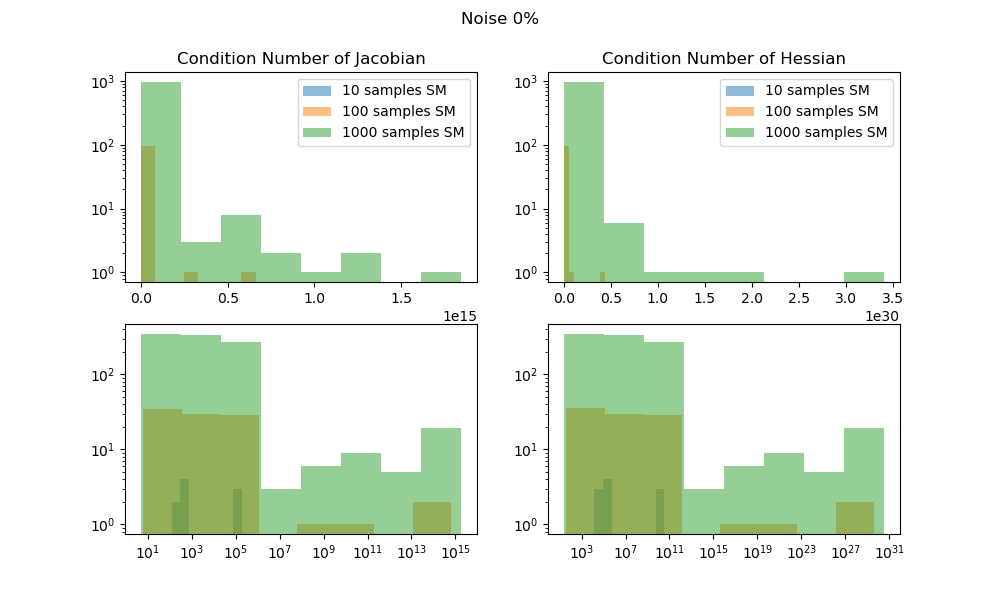

In [22]:
fig, ax = plt.subplots(2,2, figsize=(10,6))

hist, bins, _ = ax[0,0].hist(df_10['CN_J'], bins=8, alpha=0.5, label = '10 samples SM')
logbins = np.logspace(np.log10(bins[0]),np.log10(bins[-1]),len(bins))
ax[1,0].hist(df_10['CN_J'], alpha=0.5, bins=logbins, label = '10 samples SM')

hist, bins, _ = ax[0,0].hist(df_100_clean['CN_J'], bins=8, alpha=0.5, label = '100 samples SM')
logbins = np.logspace(np.log10(bins[0]),np.log10(bins[-1]),len(bins))
ax[1,0].hist(df_100_clean['CN_J'], alpha=0.5, bins=logbins, label = '100 samples SM')

hist, bins, _ = ax[0,0].hist(df_1000_clean['CN_J'], bins=8, alpha=0.5, label = '1000 samples SM', log=True)
logbins = np.logspace(np.log10(bins[0]),np.log10(bins[-1]),len(bins))
ax[1,0].hist(df_1000_clean['CN_J'], alpha=0.5, bins=logbins, label = '1000 samples SM', log=True)

ax[0,0].legend()
ax[1,0].set_xscale('log')
ax[0,0].set_title('Condition Number of Jacobian')

hist, bins, _ = ax[0,1].hist(df_10['CN_H'], bins=8, alpha=0.5, label = '10 samples SM')
logbins = np.logspace(np.log10(bins[0]),np.log10(bins[-1]),len(bins))
ax[1,1].hist(df_10['CN_H'], alpha=0.5, bins=logbins, label = '10 samples SM')

hist, bins, _ = ax[0,1].hist(df_100_clean['CN_H'], bins=8, alpha=0.5, label = '100 samples SM')
logbins = np.logspace(np.log10(bins[0]),np.log10(bins[-1]),len(bins))
ax[1,1].hist(df_100_clean['CN_H'], alpha=0.5, bins=logbins, label = '100 samples SM')

hist, bins, _ = ax[0,1].hist(df_1000_clean['CN_H'], bins=8, alpha=0.5, label = '1000 samples SM', log=True)
logbins = np.logspace(np.log10(bins[0]),np.log10(bins[-1]),len(bins))
ax[1,1].hist(df_1000_clean['CN_H'], alpha=0.5, bins=logbins, label = '1000 samples SM', log=True)

ax[0,1].legend()
ax[1,1].set_xscale('log')
ax[0,1].set_title('Condition Number of Hessian')

fig.suptitle('Noise 0%')

# Plot data for all "equivalent" models

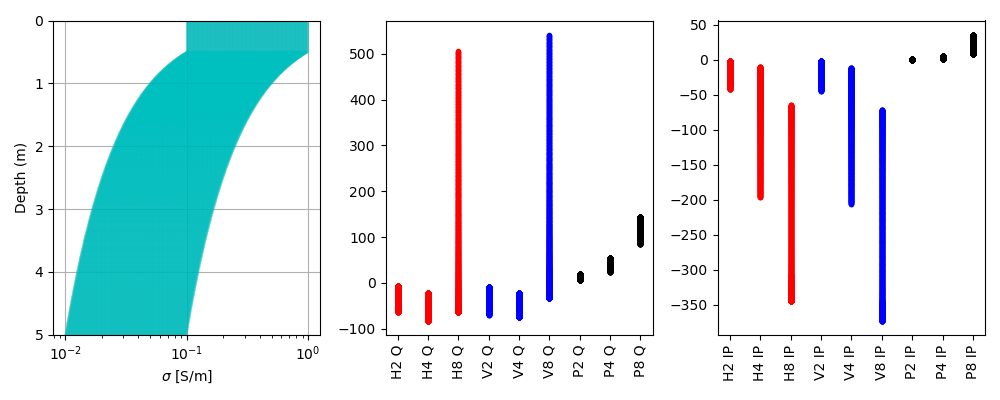

In [23]:
fig, ax = plt.subplots(1,3, figsize =(10,4))

xticks1 = ['H2 Q', 'H4 Q', 'H8 Q', 'V2 Q', 'V4 Q', 'V8 Q','P2 Q', 'P4 Q', 'P8 Q',]
xticks2 = ['H2 IP', 'H4 IP', 'H8 IP', 'V2 IP', 'V4 IP', 'V8 IP', 'P2 IP', 'P4 IP', 'P8 IP' ]

for m in models:
    drawModel1D(ax[0], model=m, zmax=5, color='c', alpha=0.1, xlabel='$\sigma$ [S/m]')
    d = FOP.response(m)
    ax[1].plot([0,1,2], d[:3], '.r')   # HOP
    ax[2].plot([0,1,2], d[3:6], '.r')  # HIP
    ax[1].plot([3,4,5], d[6:9], '.b')  # VOP
    ax[2].plot([3,4,5], d[9:12], '.b') # VIP
    ax[1].plot([6,7,8], d[12:15], '.k') # POP
    ax[2].plot([6,7,8], d[15:], '.k')   # PIP
    
ax[1].set_xticks(range(len(d[:9])), labels=xticks1, rotation = 90)
ax[2].set_xticks(range(len(d[9:])), labels=xticks2, rotation = 90)
ax[0].set_xscale('log')

plt.tight_layout()
#ax[0].invert_yaxis()

Text(0.5, 1.0, 'Sum of all Jacobians')

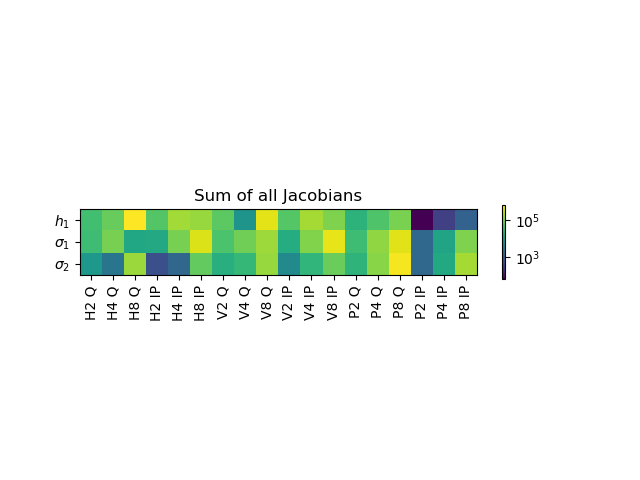

In [24]:
fig, ax = plt.subplots()

c=ax.imshow(np.abs(np.sum(J_s, axis=0)).T, norm='log')
fig.colorbar(c, shrink=0.2, ax=ax)
xticks = ['H2 Q', 'H4 Q', 'H8 Q', 'H2 IP', 'H4 IP', 'H8 IP', 'V2 Q', 'V4 Q', 'V8 Q',
          'V2 IP', 'V4 IP', 'V8 IP', 'P2 Q', 'P4 Q', 'P8 Q', 'P2 IP', 'P4 IP', 'P8 IP' ]
yticks = ['$h_1$', '$\sigma_1$', '$\sigma_2$' ]
ax.set_xticks(range(len(data)), labels=xticks, rotation = 90)
ax.set_yticks(range(len(model_true_1)), labels=yticks)
ax.set_title('Sum of all Jacobians')

#  Show Results in 3D

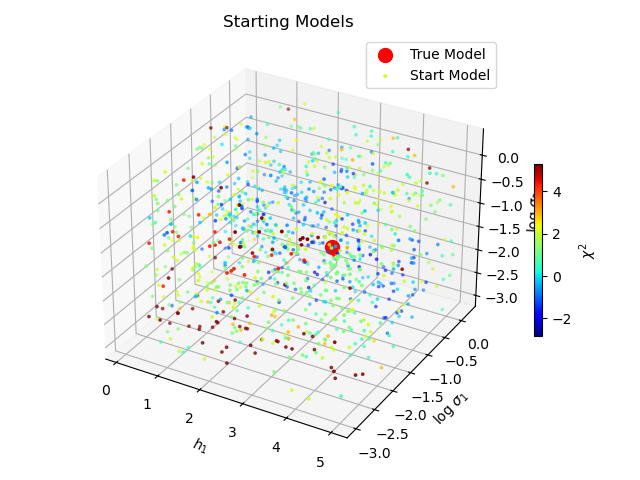

In [25]:
ax = plt.figure().add_subplot(projection='3d')

#ax.scatter(np.array(model_inv)[:,0], np.log10(np.array(model_inv)[:,1]), np.log10(np.array(model_inv)[:,2]), s=1, alpha=0.5, c='k')# c=df_1000['CN_J'])
ax.scatter(model_true_1[0], np.log10(model_true_1[1]), np.log10(model_true_1[2]), s=100, c='r', label = 'True Model')
c = ax.scatter(np.array(model_start_1000)[:,0], np.log10(np.array(model_start_1000)[:,1]), np.log10(np.array(model_start_1000)[:,2]), s=3, 
          c = np.log10(chi2), label = 'Start Model', cmap='jet')

#ax.set_ylim([np.log10(np.min(np.array(start_models)[:,1])), np.log10(np.max(np.array(start_models)[:,1]))])
#ax.set_zlim([np.log10(np.min(np.array(start_models)[:,1])), np.log10(np.max(np.array(start_models)[:,1]))])
ax.legend()
ax.set_xlabel('$h_1$')
ax.set_ylabel('log $\sigma_1$')
ax.set_zlabel('log $\sigma_2$')
ax.set_title('Starting Models')
fig.colorbar(c, shrink =0.4, label = '$\chi^2$', ax=ax)
plt.tight_layout()



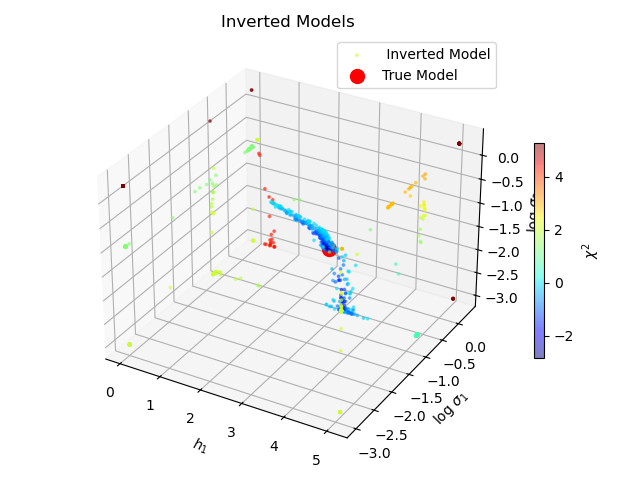

In [26]:
ax = plt.figure().add_subplot(projection='3d')

c = ax.scatter(np.array(model_inv)[:,0], np.log10(np.array(model_inv)[:,1]), np.log10(np.array(model_inv)[:,2]), s=3, alpha=0.5,  
               c =np.log10(chi2), label =' Inverted Model', cmap = 'jet') 
ax.scatter(model_true_1[0], np.log10(model_true_1[1]), np.log10(model_true_1[2]), s=100, c='r', label = 'True Model')
#c = ax.scatter(np.array(model_start_1000)[:,0], np.log10(np.array(model_start_1000)[:,1]), np.log10(np.array(model_start_1000)[:,2]), s=3, 
#          c = np.log10(chi2))

#ax.set_ylim([np.log10(np.min(np.array(start_models)[:,1])), np.log10(np.max(np.array(start_models)[:,1]))])
#ax.set_zlim([np.log10(np.min(np.array(start_models)[:,1])), np.log10(np.max(np.array(start_models)[:,1]))])
ax.legend()
ax.set_title('Inverted Models')
ax.set_xlabel('$h_1$')
ax.set_ylabel('log $\sigma_1$')
ax.set_zlabel('log $\sigma_2$')

fig.colorbar(c, shrink =0.5,  label = '$\chi^2$', ax=ax)
plt.tight_layout()



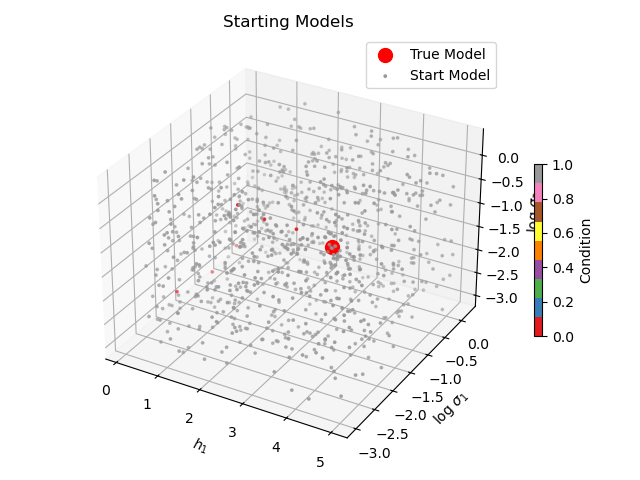

In [27]:
ax = plt.figure().add_subplot(projection='3d')

#ax.scatter(np.array(model_inv)[:,0], np.log10(np.array(model_inv)[:,1]), np.log10(np.array(model_inv)[:,2]), s=1, alpha=0.5, c='k')# c=df_1000['CN_J'])
ax.scatter(model_true_1[0], np.log10(model_true_1[1]), np.log10(model_true_1[2]), s=100, c='r', label = 'True Model')
c = ax.scatter(np.array(model_start_1000)[:,0], np.log10(np.array(model_start_1000)[:,1]), np.log10(np.array(model_start_1000)[:,2]), s=3, 
          c = df_1000['cond'], label = 'Start Model', cmap='Set1')

#ax.set_ylim([np.log10(np.min(np.array(start_models)[:,1])), np.log10(np.max(np.array(start_models)[:,1]))])
#ax.set_zlim([np.log10(np.min(np.array(start_models)[:,1])), np.log10(np.max(np.array(start_models)[:,1]))])
ax.legend()
ax.set_xlabel('$h_1$')
ax.set_ylabel('log $\sigma_1$')
ax.set_zlabel('log $\sigma_2$')
ax.set_title('Starting Models')
fig.colorbar(c, shrink =0.4, label = 'Condition', ax=ax)
plt.tight_layout()


In [28]:
# Calculate root mean squared errors

RMSE_h1 = []
RMSE_s1 = []
RMSE_s2 = []

for m in model_inv:
    RMSE_h1.append(root_mean_squared_error([m[0]], [model_true_1[0]]))
    RMSE_s1.append(root_mean_squared_error([m[1]], [model_true_1[1]]))
    RMSE_s2.append(root_mean_squared_error([m[2]], [model_true_1[2]]))

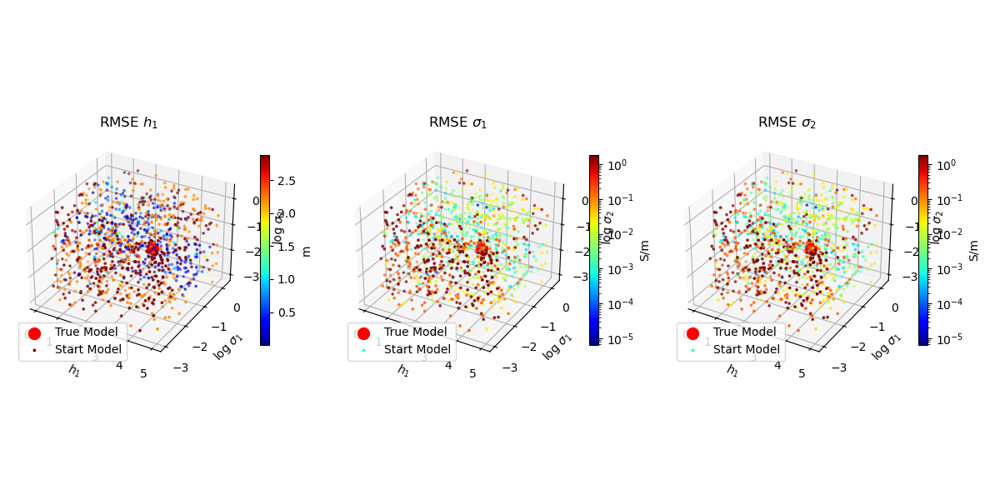

In [29]:
fig, ax = plt.subplots(1, 3, subplot_kw={'projection': '3d'}, figsize=(12,6))

#ax.scatter(np.array(model_inv)[:,0], np.log10(np.array(model_inv)[:,1]), np.log10(np.array(model_inv)[:,2]), s=1, alpha=0.5, c='k')# c=df_1000['CN_J'])
ax[0].scatter(model_true_1[0], np.log10(model_true_1[1]), np.log10(model_true_1[2]), s=100, c='r', label = 'True Model')
c = ax[0].scatter(np.array(model_start_1000)[:,0], np.log10(np.array(model_start_1000)[:,1]), np.log10(np.array(model_start_1000)[:,2]), s=3, 
          c = RMSE_h1, label = 'Start Model', cmap='jet')
fig.colorbar(c, shrink =0.4, label = 'm', ax=ax[0])

ax[1].scatter(model_true_1[0], np.log10(model_true_1[1]), np.log10(model_true_1[2]), s=100, c='r', label = 'True Model')
c = ax[1].scatter(np.array(model_start_1000)[:,0], np.log10(np.array(model_start_1000)[:,1]), np.log10(np.array(model_start_1000)[:,2]), s=3, 
          c = RMSE_s1, label = 'Start Model', cmap='jet',norm='log')
fig.colorbar(c, shrink =0.4, label = 'S/m', ax=ax[1])

ax[2].scatter(model_true_1[0], np.log10(model_true_1[1]), np.log10(model_true_1[2]), s=100, c='r', label = 'True Model')
c = ax[2].scatter(np.array(model_start_1000)[:,0], np.log10(np.array(model_start_1000)[:,1]), np.log10(np.array(model_start_1000)[:,2]), s=3, 
          c = RMSE_s1, label = 'Start Model', cmap='jet',norm='log')
fig.colorbar(c, shrink =0.4, label = 'S/m', ax=ax[2])

#ax.set_ylim([np.log10(np.min(np.array(start_models)[:,1])), np.log10(np.max(np.array(start_models)[:,1]))])
#ax.set_zlim([np.log10(np.min(np.array(start_models)[:,1])), np.log10(np.max(np.array(start_models)[:,1]))])
ax[0].legend()
ax[1].legend()
ax[2].legend()
ax[0].set_xlabel('$h_1$')
ax[0].set_ylabel('log $\sigma_1$')
ax[0].set_zlabel('log $\sigma_2$')
ax[0].set_title('RMSE $h_1$')

ax[1].set_xlabel('$h_1$')
ax[1].set_ylabel('log $\sigma_1$')
ax[1].set_zlabel('log $\sigma_2$')
ax[1].set_title('RMSE $\sigma_1$')

ax[2].set_xlabel('$h_1$')
ax[2].set_ylabel('log $\sigma_1$')
ax[2].set_zlabel('log $\sigma_2$')
ax[2].set_title('RMSE $\sigma_2$')

plt.tight_layout()

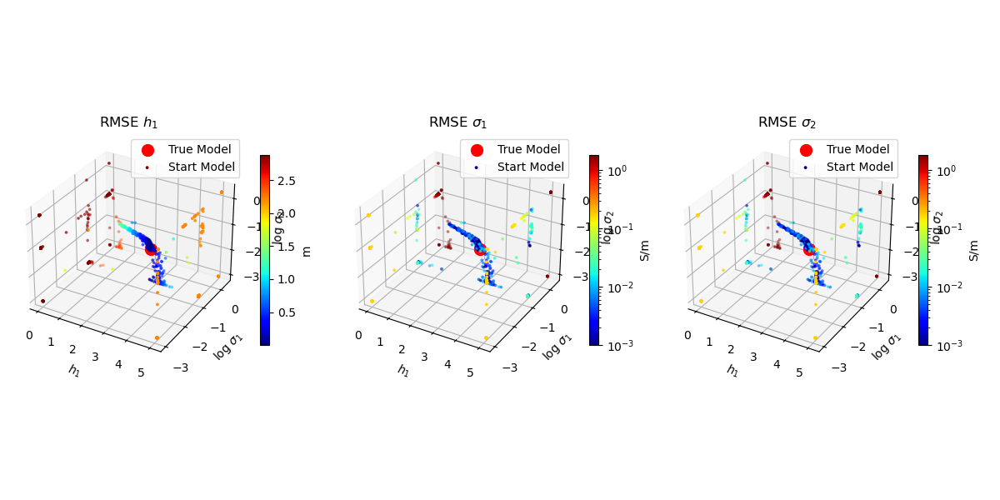

In [30]:
fig, ax = plt.subplots(1, 3, subplot_kw={'projection': '3d'}, figsize=(12,6))

#ax.scatter(np.array(model_inv)[:,0], np.log10(np.array(model_inv)[:,1]), np.log10(np.array(model_inv)[:,2]), s=1, alpha=0.5, c='k')# c=df_1000['CN_J'])
ax[0].scatter(model_true_1[0], np.log10(model_true_1[1]), np.log10(model_true_1[2]), s=100, c='r', label = 'True Model')
c = ax[0].scatter(np.array(model_inv)[:,0], np.log10(np.array(model_inv)[:,1]), np.log10(np.array(model_inv)[:,2]), s=3, 
          c = RMSE_h1, label = 'Start Model', cmap='jet')
fig.colorbar(c, shrink =0.4, label = 'm', ax=ax[0])

ax[1].scatter(model_true_1[0], np.log10(model_true_1[1]), np.log10(model_true_1[2]), s=100, c='r', label = 'True Model')
c = ax[1].scatter(np.array(model_inv)[:,0], np.log10(np.array(model_inv)[:,1]), np.log10(np.array(model_inv)[:,2]), s=3, 
          c = RMSE_s1, label = 'Start Model', cmap='jet', norm='log', vmin = 1/1000)
fig.colorbar(c, shrink =0.4, label = 'S/m', ax=ax[1])

ax[2].scatter(model_true_1[0], np.log10(model_true_1[1]), np.log10(model_true_1[2]), s=100, c='r', label = 'True Model')
c = ax[2].scatter(np.array(model_inv)[:,0], np.log10(np.array(model_inv)[:,1]), np.log10(np.array(model_inv)[:,2]), s=3, 
          c = RMSE_s1, label = 'Start Model', cmap='jet', norm='log', vmin = 1/1000)
fig.colorbar(c, shrink =0.4, label = 'S/m', ax=ax[2], )

#ax.set_ylim([np.log10(np.min(np.array(start_models)[:,1])), np.log10(np.max(np.array(start_models)[:,1]))])
#ax.set_zlim([np.log10(np.min(np.array(start_models)[:,1])), np.log10(np.max(np.array(start_models)[:,1]))])
ax[0].legend()
ax[1].legend()
ax[2].legend()
ax[0].set_xlabel('$h_1$')
ax[0].set_ylabel('log $\sigma_1$')
ax[0].set_zlabel('log $\sigma_2$')
ax[0].set_title('RMSE $h_1$')

ax[1].set_xlabel('$h_1$')
ax[1].set_ylabel('log $\sigma_1$')
ax[1].set_zlabel('log $\sigma_2$')
ax[1].set_title('RMSE $\sigma_1$')

ax[2].set_xlabel('$h_1$')
ax[2].set_ylabel('log $\sigma_1$')
ax[2].set_zlabel('log $\sigma_2$')
ax[2].set_title('RMSE $\sigma_2$')

plt.tight_layout()

In [31]:
df_results = pd.DataFrame(model_inv, columns=['h_1', 's_1', 's_2'])
df_results['RMSE_h1'] = RMSE_h1
df_results['RMSE_s1'] = RMSE_s1
df_results['RMSE_s2'] = RMSE_s2
df_results['log chi2'] = np.log10(chi2)

df_results

,h_1,s_1,s_2,RMSE_h1,RMSE_s1,RMSE_s2,log chi2
0,0.010000,0.172152,0.001000,2.878895,0.000925,0.016308,1.994231
1,1.738192,0.174867,0.066516,1.150703,0.001791,0.049208,-0.272133
2,5.100000,0.147043,0.001000,2.211105,0.026034,0.016308,0.620815
3,0.010000,0.149053,0.001000,2.878895,0.024023,0.016308,1.994041
4,0.010000,0.001000,0.116773,2.878895,0.172077,0.099465,1.292618
...,...,...,...,...,...,...,...
995,5.099958,0.001000,0.276605,2.211063,0.172077,0.259298,2.168069
996,2.754245,0.169943,0.020616,0.134650,0.003134,0.003308,-0.884095
997,0.010008,2.000000,0.121691,2.878887,1.826923,0.104383,1.255441
998,2.874687,0.174313,0.024341,0.014208,0.001237,0.007034,-0.803344


In [32]:
df_results_clean = df_results[df_results['log chi2'] < 0]
df_results_clean = df_results_clean.reset_index()

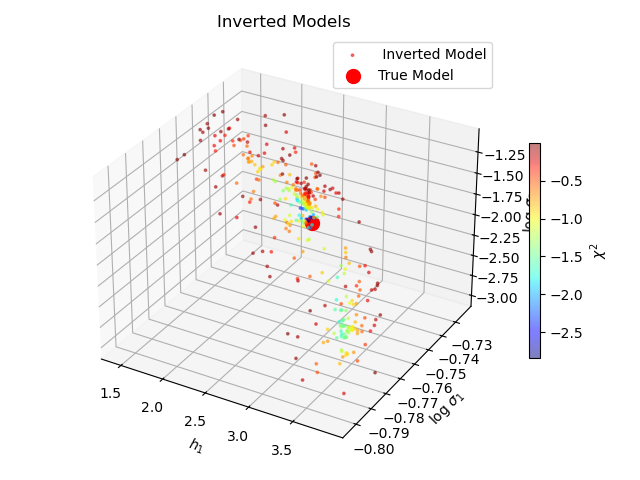

In [33]:
ax = plt.figure().add_subplot(projection='3d')

c = ax.scatter(df_results_clean['h_1'], np.log10(df_results_clean['s_1']), np.log10(df_results_clean['s_2']), s=3, alpha=0.5,  
               c = df_results_clean['log chi2'], label =' Inverted Model', cmap = 'jet') 
ax.scatter(model_true_1[0], np.log10(model_true_1[1]), np.log10(model_true_1[2]), s=100, c='r', label = 'True Model')
#c = ax.scatter(np.array(model_start_1000)[:,0], np.log10(np.array(model_start_1000)[:,1]), np.log10(np.array(model_start_1000)[:,2]), s=3, 
#          c = np.log10(chi2))

#ax.set_ylim([np.log10(np.min(np.array(start_models)[:,1])), np.log10(np.max(np.array(start_models)[:,1]))])
#ax.set_zlim([np.log10(np.min(np.array(start_models)[:,1])), np.log10(np.max(np.array(start_models)[:,1]))])
ax.legend()
ax.set_title('Inverted Models')
ax.set_xlabel('$h_1$')
ax.set_ylabel('log $\sigma_1$')
ax.set_zlabel('log $\sigma_2$')

fig.colorbar(c, shrink =0.5,  label = '$\chi^2$', ax=ax)
plt.tight_layout()

In [34]:
df_results_clean['ratio_s1s2'] = df_results_clean.s_1 / df_results_clean.s_2
df_results_clean['product_h1s2'] = df_results_clean.h_1 * df_results_clean.s_2

df_results_clean = df_results_clean.sort_values(by=['ratio_s1s2'])

Text(0.6, 0.13, ' $log_{10} (h_1 * \\sigma_2)$ =0.19 $(log_{10} (\\sigma_1 / \\sigma_2))^2$ +-0.18 $log_{10} (\\sigma_1 / \\sigma_2)$ +0.04')

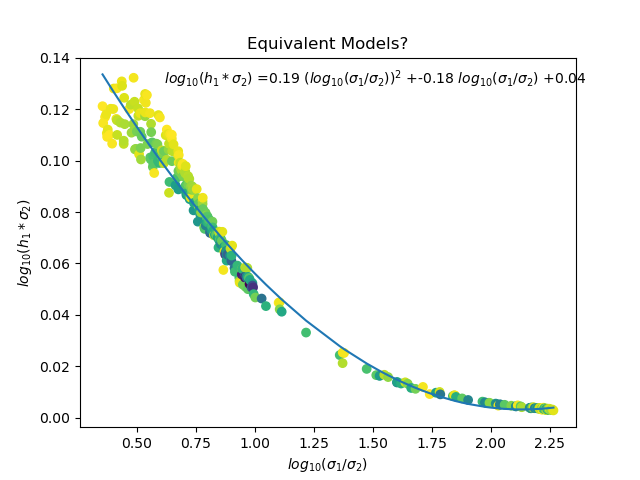

In [35]:
fig, ax = plt.subplots()

poly_y = np.poly1d(np.polyfit(np.log10(df_results_clean.ratio_s1s2), df_results_clean.product_h1s2, 2))
poly_x = np.log10(df_results_clean.ratio_s1s2)

ax.scatter(np.log10(df_results_clean['s_1'] / df_results_clean['s_2']), df_results_clean['h_1'] * df_results_clean['s_2'],  c= df_results_clean['log chi2'])
ax.plot(poly_x, poly_y(poly_x), )

ax.set_xlabel('$log_{10} (\sigma_1 / \sigma_2)$')
ax.set_ylabel('$log_{10} (h_1 * \sigma_2)$')
ax.set_title('Equivalent Models?')

ax.text(0.6, 0.13, ' $log_{10} (h_1 * \sigma_2)$ =' f'{poly_y[0]:.2f}'+' $(log_{10} (\sigma_1 / \sigma_2))^2$ +' 
        + f'{poly_y[1]:.2f}'+' $log_{10} (\sigma_1 / \sigma_2)$ +'+ f'{poly_y[2]:.2f}')

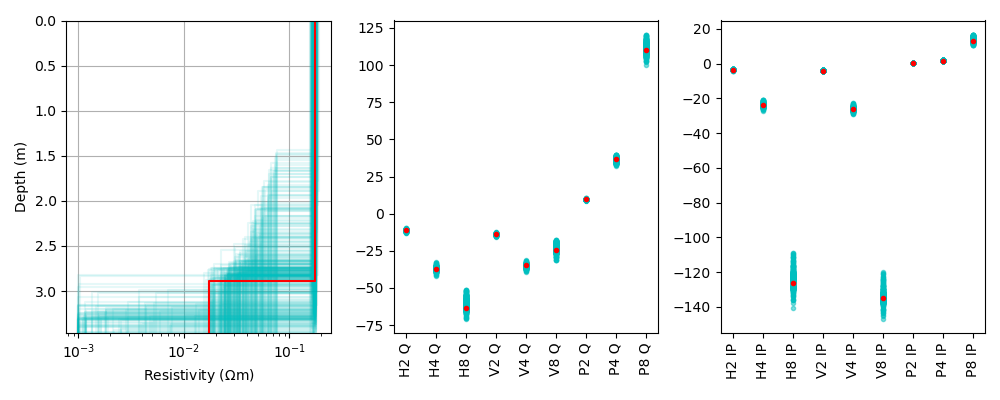

In [36]:
fig, ax = plt.subplots(1,3, figsize =(10,4))

xticks1 = ['H2 Q', 'H4 Q', 'H8 Q', 'V2 Q', 'V4 Q', 'V8 Q','P2 Q', 'P4 Q', 'P8 Q',]
xticks2 = ['H2 IP', 'H4 IP', 'H8 IP', 'V2 IP', 'V4 IP', 'V8 IP', 'P2 IP', 'P4 IP', 'P8 IP' ]

for i in range(len(df_results_clean)):
    drawModel1D(ax[0], model=[df_results_clean['h_1'][i], df_results_clean['s_1'][i], df_results_clean['s_2'][i]], zmax=5, color='c', alpha=0.1, xlabel='$\sigma$ [S/m]')
    d = FOP.response([df_results_clean['h_1'][i], df_results_clean['s_1'][i], df_results_clean['s_2'][i]])
    ax[1].plot([0,1,2], d[:3], '.c', alpha=0.5)   # HOP
    ax[2].plot([0,1,2], d[3:6], '.c', alpha=0.5)  # HIP
    ax[1].plot([3,4,5], d[6:9], '.c', alpha=0.5)  # VOP
    ax[2].plot([3,4,5], d[9:12], '.c', alpha=0.5) # VIP
    ax[1].plot([6,7,8], d[12:15], '.c', alpha=0.5) # POP
    ax[2].plot([6,7,8], d[15:], '.c', alpha=0.5)   # PIP

drawModel1D(ax[0], model=model_true_1, c='r')
d = FOP.response(model_true_1)
ax[1].plot([0,1,2], d[:3], '.r', )   # HOP
ax[2].plot([0,1,2], d[3:6], '.r', )  # HIP
ax[1].plot([3,4,5], d[6:9], '.r', )  # VOP
ax[2].plot([3,4,5], d[9:12], '.r',) # VIP
ax[1].plot([6,7,8], d[12:15], '.r',) # POP
ax[2].plot([6,7,8], d[15:], '.r', )   # PIP

ax[1].set_xticks(range(len(d[:9])), labels=xticks1, rotation = 90)
ax[2].set_xticks(range(len(d[9:])), labels=xticks2, rotation = 90)
ax[0].set_xscale('log')

plt.tight_layout()

In [37]:
def nrmse(obs, pred):
    RMSE = root_mean_squared_error(obs, pred)
    range_y = np.max(obs) - np.min(pred)
    NRMSE = RMSE / range_y
    return NRMSE


In [38]:
NRMSE_mod = []
NRMSE_dat = []

for m in model_inv:
    NRMSE_mod.append(nrmse(model_true_1, m))

data_true_1 = FOP.response(model_true_1)

for m in model_inv:
    d = FOP.response(m)
    NRMSE_dat.append(nrmse(data_true_1, d))

In [39]:
df_results['log CN_J'] = np.log10(df_1000.CN_J)
df_results['log CN_H'] = np.log10(df_1000.CN_H)
df_results['NRMSE model'] = NRMSE_mod
df_results['NRMSE data'] = NRMSE_dat
df_results['chi2'] = chi2

In [40]:
df_results

,h_1,s_1,s_2,RMSE_h1,RMSE_s1,RMSE_s2,log chi2,log CN_J,log CN_H,NRMSE model,NRMSE data,chi2
0,0.010000,0.172152,0.001000,2.878895,0.000925,0.016308,1.994231,2.836689,5.673378,0.575560,0.499083,98.680409
1,1.738192,0.174867,0.066516,1.150703,0.001791,0.049208,-0.272133,2.078427,4.156854,0.235605,0.013912,0.534401
2,5.100000,0.147043,0.001000,2.211105,0.026034,0.016308,0.620815,2.837419,5.674838,0.442089,0.048755,4.176525
3,0.010000,0.149053,0.001000,2.878895,0.024023,0.016308,1.994041,2.836669,5.673339,0.575580,0.499133,98.637261
4,0.010000,0.001000,0.116773,2.878895,0.172077,0.099465,1.292618,5.264734,10.529466,0.576921,0.141252,19.616332
...,...,...,...,...,...,...,...,...,...,...,...,...
995,5.099958,0.001000,0.276605,2.211063,0.172077,0.259298,2.168069,2.454763,4.909525,0.446394,0.621071,147.254541
996,2.754245,0.169943,0.020616,0.134650,0.003134,0.003308,-0.884095,2.533281,5.066562,0.027119,0.005625,0.130588
997,0.010008,2.000000,0.121691,2.878887,1.826923,0.104383,1.255441,5.367404,10.734811,0.684111,0.131869,18.007004
998,2.874687,0.174313,0.024341,0.014208,0.001237,0.007034,-0.803344,2.219869,4.439737,0.003205,0.005381,0.157274


In [41]:
px.parallel_coordinates(df_results, color='log chi2', dimensions=['NRMSE model', 'NRMSE data', 'log chi2', 'log CN_J', 'log CN_H'])

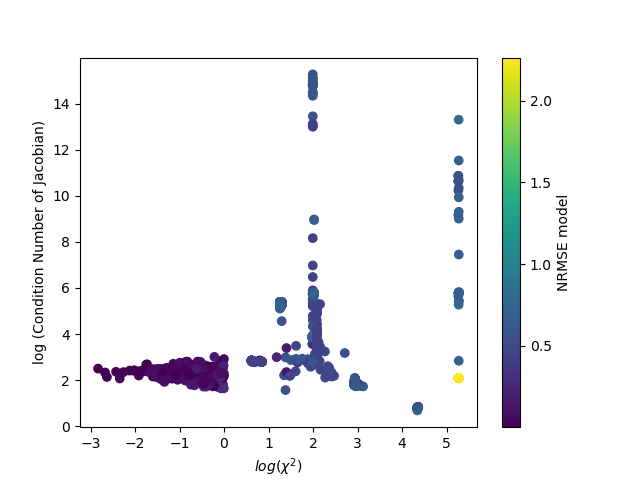

In [42]:
fig, ax = plt.subplots()

c = ax.scatter(df_results['log chi2'], df_results['log CN_J'], c=df_results['NRMSE model'])
ax.set_ylabel('log (Condition Number of Jacobian)')
ax.set_xlabel('$log (\chi^2)$')

fig.colorbar(c, label='NRMSE model')

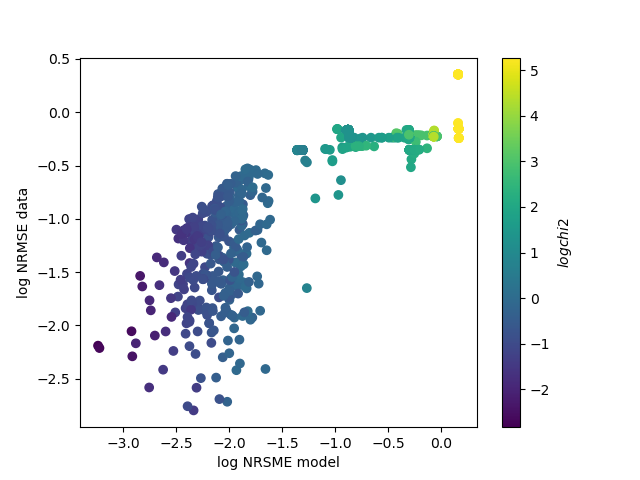

In [43]:
fig, ax = plt.subplots()

c = ax.scatter(np.log10(df_results['NRMSE data']), np.log10(df_results['NRMSE model']), c=df_results['log chi2'])
ax.set_ylabel('log NRMSE data')
ax.set_xlabel('log NRSME model')

fig.colorbar(c, label='$log chi2$') # Use binary color scale to chi2 < 1 accepted and chi2 > 1 not accepted
# to prove chi2 is not necessarily a good indicator for several UC and UR cases
# put line [0,0], [-2, -2] All points are above that line , data error seems larger than data error

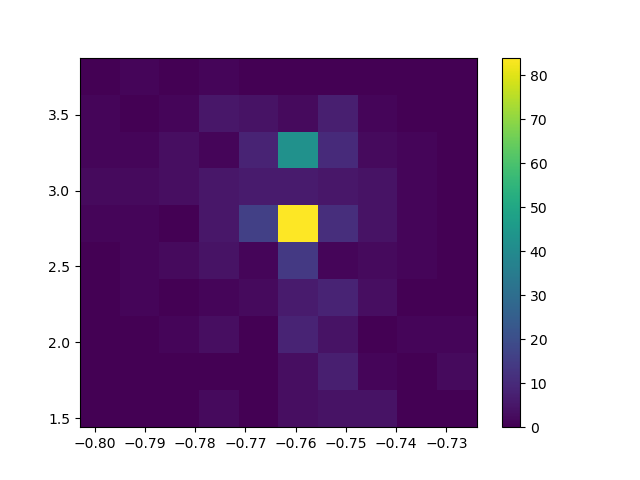

In [44]:
fig, ax = plt.subplots()

c = ax.hist2d(np.log10(df_results_clean.s_1), df_results_clean.h_1)

fig.colorbar(c[3])

In [45]:
model_true_1

array([2.88889506, 0.17307655, 0.01730766])